In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import os
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

In [4]:
# Read sign timestamps ( since selected year, with pre-market included)
df_inds = pd.read_csv(params.inds_unsc_csv, index_col=0, parse_dates=True)
# compute synthetic ask/bid from close_raw and configured spread
df_inds['ask'] = df_inds['close'] * (1 + params.bidask_spread_pct/100)
df_inds['bid'] = df_inds['close'] * (1 - params.bidask_spread_pct/100)

df_inds.head()

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi,macd_line,macd_signal,macd_diff,atr,atr_pct,bb_lband,bb_hband,bb_w,plus_di,minus_di,adx,obv,vwap,vwap_dev_pct,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,ret_90,sma_90,sma_pct_90,ema_90,roc_90,rsi_90,atr_90,atr_pct_90,bb_lband_90,bb_hband_90,bb_w_90,plus_di_90,minus_di_90,adx_90,obv_diff_90,obv_pct_90,obv_sma_90,obv_z_90,vwap_90,vwap_dev_pct_90,z_vwap_dev_90,vol_spike_90,vol_z_90,ret_std_90,rolling_max_close_90,rolling_min_close_90,dist_high_90,dist_low_90,macd_line_90,macd_signal_90,macd_diff_90,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,volume_z_90,vol_spike_z_90,ret_std_z_90,obv_pct_z_90,vwap_dev_pct_z_90,bb_w_z_90,atr_z_90,macd_diff_z_90,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_60,mom_std_60,mom_sum_90,mom_std_90,eng_ema_cross_up,eng_ema_cross_down,ask,bid
2009-01-02 11:02:00,3.069643,3.069643,3.069643,3.069643,13160.0,2.712386e-12,0.0,0.0,3.069643,3.069643,0.0,0.0,3.069643,3.069643,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,3.069643,3.069643,0.0,0.0,0.0,0.0,1618680.0,3.069643,-1.446713e-14,1.0,0.0,3.069643,3.069643,0.0,0.0,1533140.0,184240.0,60020.011635,1533140.0,1.553797,0.0,3.069643,0.0,3.069643,0.0,100.0,0.0,0.0,3.069643,3.069643,0.0,0.0,0.0,0.0,394800.0,128614.310646,1427860.0,0.674491,3.069643,-1.446713e-14,0.0,1.0,0.0,0.0,3.069643,3.069643,0.0,0.0,0.0,0.0,0.0,0.0,3.069643,0.0,3.069643,0.0,100.0,0.0,0.0,3.069643,3.069643,0.0,0.0,0.0,0.0,789600.0,257228.621291,1230460.0,0.674491,3.069643,-1.446713e-14,0.0,1.0,0.0,0.0,3.069643,3.069643,0.0,0.0,0.0,0.0,0.0,0.0,3.069643,0.0,3.069643,0.0,100.0,0.0,0.0,3.069643,3.069643,0.0,0.0,0.0,0.0,1184400.0,385842.931937,1033060.0,20.0,3.069643,-1.446713e-14,0.0,1.0,0.0,0.0,3.069643,3.069643,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.355556,0.354167,0.071429,0.5,0.50274,0.5,0.0,0.0,0.0,0.0,0.0,0.3,0.0,0.123348,0.0,0.0,0.0,0.0,-1.446713e-14,0.0,0.0,1.38873,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.070257,3.069029
2009-01-02 11:03:00,3.069643,3.069643,3.069643,3.069643,13160.0,3.073542e-12,0.0,0.0,3.069643,3.069643,0.0,0.0,3.069643,3.069643,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,3.069643,3.069643,0.0,0.0,0.0,0.0,1631840.0,3.069643,-1.446713e-14,1.0,0.0,3.069643,3.069643,0.0,0.0,1546300.0,184240.0,60020.011635,1546300.0,1.553797,0.0,3.069643,0.0,3.069643,0.0,100.0,0.0,0.0,3.069643,3.069643,0.0,0.0,0.0,0.0,394800.0,128614.310646,1441020.0,0.674491,3.069643,-1.446713e-14,0.0,1.0,0.0,0.0,3.069643,3.069643,0.0,0.0,0.0,0.0,0.0,0.0,3.069643,0.0,3.069643,0.0,100.0,0.0,0.0,3.069643,3.069643,0.0,0.0,0.0,0.0,789600.0,257228.621291,1243620.0,0.674491,3.069643,-1.446713e-14,0.0,1.0,0.0,0.0,3.069643,3.

In [16]:
importlib.reload(params) #####
importlib.reload(strategies) #####

df_month = df_inds[df_inds.index.to_period("M") == params.month_to_check]
sim_results = {}
groups = df_month.groupby(df_month.index.normalize())
total_days = df_month.index.normalize().nunique()

for day, df_day in tqdm(groups, desc="Smoothing+Generate+Simulate", total=total_days):
    df_actions = strategies.generate_tradact_inds(
        df              = df_day,
        col_signal      = "ema_9",
        sign_thresh     = "ema_21",
        sellmin_idx     = params.sellmin_idx_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        sess_start      = params.sess_start_tick
    )
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            sellmin_idx = params.sellmin_idx_tick,
            sess_start  = params.sess_start_tick
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Smoothing+Generate+Simulate:   0%|          | 0/20 [00:00<?, ?it/s]

Loop finished. Days simulated: 20


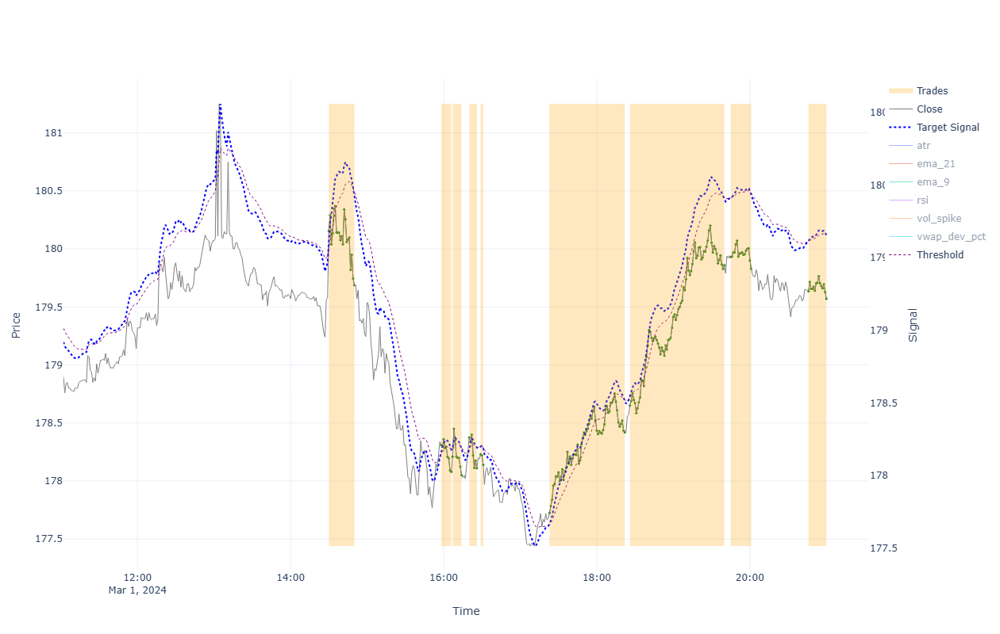


=== Performance for 2024-03-01 00:00:00 ===

BUY&HOLD:
  Bid(0) 179.534 - Ask(0) 179.826 - Fee(0) [0.004+0.029] = -0.325
TRADES:
  Bid(1) 179.651 - Ask(1) 180.191 - Fee(1) [0.004+0.029] = -0.573
  Bid(2) 178.044 - Ask(2) 178.346 - Fee(2) [0.004+0.029] = -0.334
  Bid(3) 178.015 - Ask(3) 178.246 - Fee(3) [0.004+0.029] = -0.263
  Bid(4) 178.074 - Ask(4) 178.411 - Fee(4) [0.004+0.029] = -0.369
  Bid(5) 178.104 - Ask(5) 178.266 - Fee(5) [0.004+0.029] = -0.194
  Bid(6) 178.385 - Ask(6) 177.761 - Fee(6) [0.004+0.029] = 0.591
  Bid(7) 179.822 - Ask(7) 178.686 - Fee(7) [0.004+0.029] = 1.104
  Bid(8) 179.794 - Ask(8) 179.966 - Fee(8) [0.004+0.029] = -0.205
  Bid(9) 179.534 - Ask(9) 179.671 - Fee(9) [0.004+0.0] = -0.141
STRATEGY:
  Trade(1) -0.573 + Trade(2) -0.334 + Trade(3) -0.263 + Trade(4) -0.369 + Trade(5) -0.194 + Trade(6) 0.591 + Trade(7) 1.104 + Trade(8) -0.205 + Trade(9) -0.141 = -0.384

----------------------------------------------------------------------------------------------------

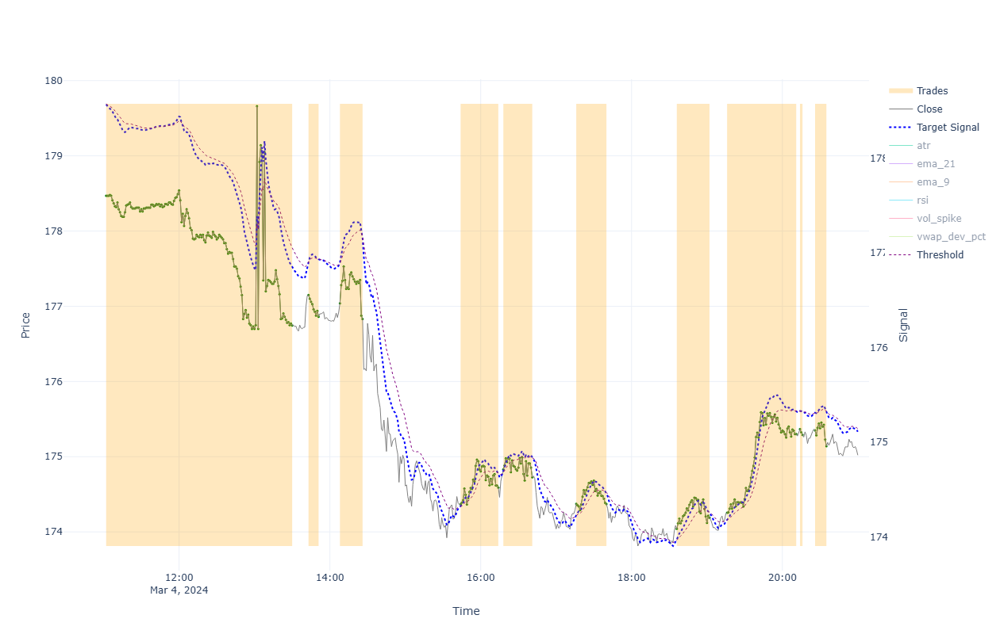


=== Performance for 2024-03-04 00:00:00 ===

BUY&HOLD:
  Bid(0) 174.985 - Ask(0) 176.78 - Fee(0) [0.004+0.028] = -1.828
TRADES:
  Bid(1) 176.71 - Ask(1) 179.534 - Fee(1) [0.0+0.029] = -2.853
  Bid(2) 176.825 - Ask(2) 177.185 - Fee(2) [0.004+0.029] = -0.393
  Bid(3) 176.795 - Ask(3) 177.075 - Fee(3) [0.004+0.029] = -0.313
  Bid(4) 174.555 - Ask(4) 174.404 - Fee(4) [0.004+0.028] = 0.119
  Bid(5) 174.69 - Ask(5) 174.867 - Fee(5) [0.004+0.028] = -0.209
  Bid(6) 174.335 - Ask(6) 174.409 - Fee(6) [0.004+0.028] = -0.106
  Bid(7) 174.155 - Ask(7) 174.075 - Fee(7) [0.004+0.028] = 0.048
  Bid(8) 175.265 - Ask(8) 174.29 - Fee(8) [0.004+0.028] = 0.943
  Bid(9) 175.255 - Ask(9) 175.4 - Fee(9) [0.004+0.028] = -0.178
  Bid(10) 175.105 - Ask(10) 175.386 - Fee(10) [0.004+0.028] = -0.313
STRATEGY:
  Trade(1) -2.853 + Trade(2) -0.393 + Trade(3) -0.313 + Trade(4) 0.119 + Trade(5) -0.209 + Trade(6) -0.106 + Trade(7) 0.048 + Trade(8) 0.943 + Trade(9) -0.178 + Trade(10) -0.313 = -3.255

--------------------

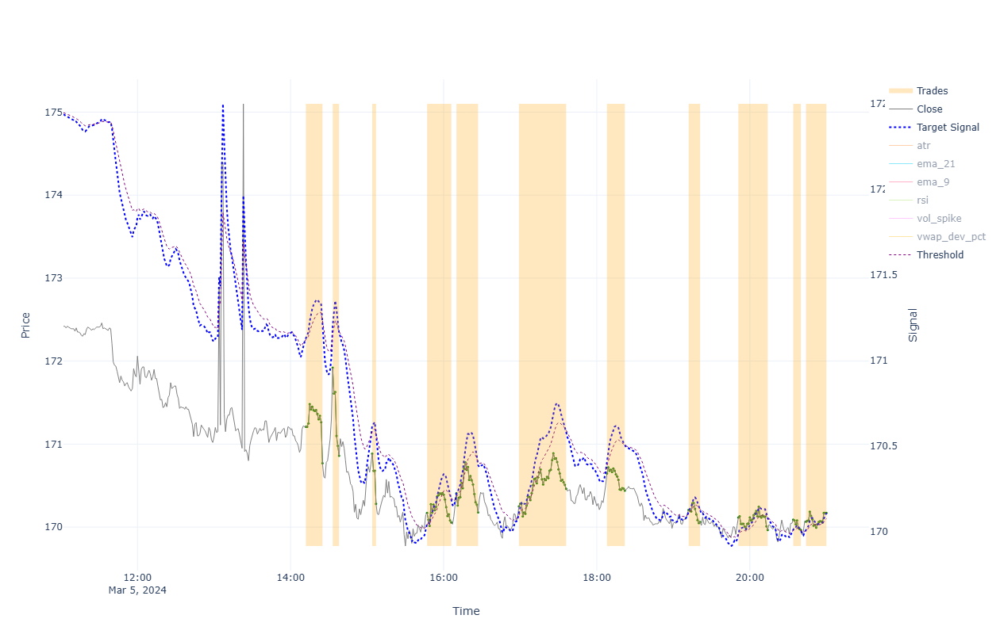


=== Performance for 2024-03-05 00:00:00 ===

BUY&HOLD:
  Bid(0) 170.136 - Ask(0) 171.144 - Fee(0) [0.004+0.028] = -1.04
TRADES:
  Bid(1) 170.736 - Ask(1) 171.244 - Fee(1) [0.004+0.028] = -0.54
  Bid(2) 170.826 - Ask(2) 171.954 - Fee(2) [0.004+0.028] = -1.16
  Bid(3) 170.246 - Ask(3) 170.919 - Fee(3) [0.004+0.028] = -0.705
  Bid(4) 170.021 - Ask(4) 170.204 - Fee(4) [0.004+0.028] = -0.215
  Bid(5) 170.144 - Ask(5) 170.442 - Fee(5) [0.004+0.028] = -0.329
  Bid(6) 170.428 - Ask(6) 170.284 - Fee(6) [0.004+0.028] = 0.112
  Bid(7) 170.406 - Ask(7) 170.679 - Fee(7) [0.004+0.028] = -0.305
  Bid(8) 170.026 - Ask(8) 170.241 - Fee(8) [0.004+0.028] = -0.247
  Bid(9) 169.931 - Ask(9) 170.149 - Fee(9) [0.004+0.028] = -0.25
  Bid(10) 169.931 - Ask(10) 170.124 - Fee(10) [0.004+0.028] = -0.225
  Bid(11) 170.136 - Ask(11) 170.099 - Fee(11) [0.004+0.0] = 0.033
STRATEGY:
  Trade(1) -0.54 + Trade(2) -1.16 + Trade(3) -0.705 + Trade(4) -0.215 + Trade(5) -0.329 + Trade(6) 0.112 + Trade(7) -0.305 + Trade(8) -0

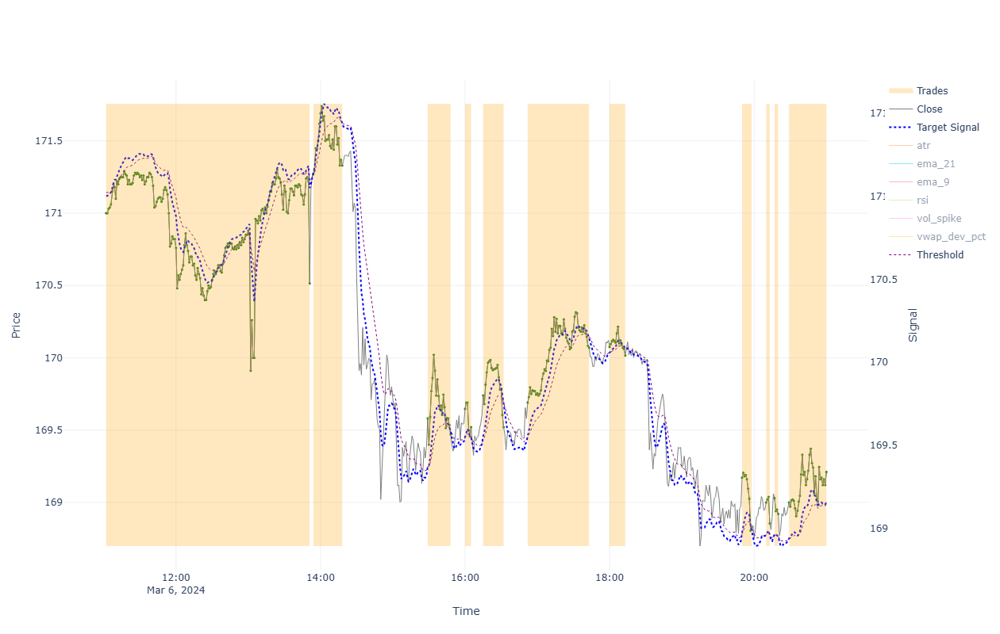


=== Performance for 2024-03-06 00:00:00 ===

BUY&HOLD:
  Bid(0) 169.176 - Ask(0) 171.224 - Fee(0) [0.004+0.028] = -2.08
TRADES:
  Bid(1) 170.481 - Ask(1) 170.136 - Fee(1) [0.0+0.028] = 0.317
  Bid(2) 171.296 - Ask(2) 171.304 - Fee(2) [0.004+0.028] = -0.04
  Bid(3) 169.436 - Ask(3) 169.614 - Fee(3) [0.004+0.028] = -0.209
  Bid(4) 169.486 - Ask(4) 169.681 - Fee(4) [0.004+0.028] = -0.226
  Bid(5) 169.486 - Ask(5) 169.774 - Fee(5) [0.004+0.028] = -0.319
  Bid(6) 170.036 - Ask(6) 169.724 - Fee(6) [0.004+0.028] = 0.28
  Bid(7) 169.982 - Ask(7) 170.109 - Fee(7) [0.004+0.028] = -0.159
  Bid(8) 168.796 - Ask(8) 169.204 - Fee(8) [0.004+0.027] = -0.439
  Bid(9) 168.82 - Ask(9) 169.034 - Fee(9) [0.004+0.027] = -0.245
  Bid(10) 168.886 - Ask(10) 169.064 - Fee(10) [0.004+0.027] = -0.209
  Bid(11) 169.176 - Ask(11) 169.034 - Fee(11) [0.004+0.0] = 0.138
STRATEGY:
  Trade(1) 0.317 + Trade(2) -0.04 + Trade(3) -0.209 + Trade(4) -0.226 + Trade(5) -0.319 + Trade(6) 0.28 + Trade(7) -0.159 + Trade(8) -0.439

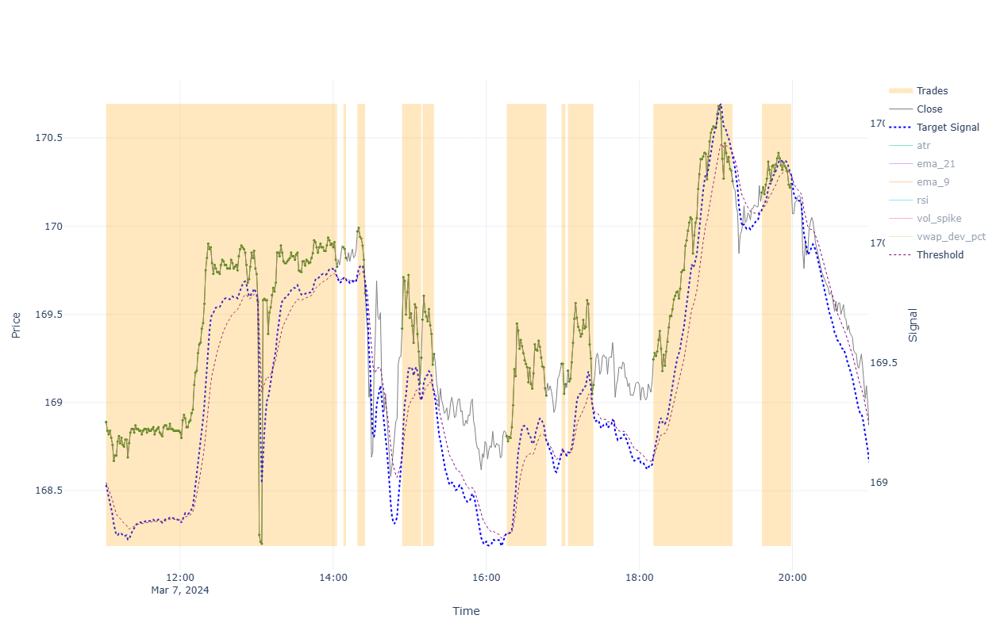


=== Performance for 2024-03-07 00:00:00 ===

BUY&HOLD:
  Bid(0) 168.846 - Ask(0) 169.844 - Fee(0) [0.004+0.027] = -1.029
TRADES:
  Bid(1) 169.736 - Ask(1) 169.176 - Fee(1) [0.0+0.028] = 0.532
  Bid(2) 169.786 - Ask(2) 169.914 - Fee(2) [0.004+0.028] = -0.16
  Bid(3) 169.586 - Ask(3) 170.004 - Fee(3) [0.004+0.028] = -0.45
  Bid(4) 169.221 - Ask(4) 169.454 - Fee(4) [0.004+0.028] = -0.264
  Bid(5) 169.241 - Ask(5) 169.504 - Fee(5) [0.004+0.028] = -0.294
  Bid(6) 169.006 - Ask(6) 168.844 - Fee(6) [0.004+0.028] = 0.131
  Bid(7) 169.07 - Ask(7) 169.254 - Fee(7) [0.004+0.028] = -0.215
  Bid(8) 169.066 - Ask(8) 169.214 - Fee(8) [0.004+0.028] = -0.179
  Bid(9) 170.221 - Ask(9) 169.279 - Fee(9) [0.004+0.028] = 0.91
  Bid(10) 170.206 - Ask(10) 170.224 - Fee(10) [0.004+0.028] = -0.05
STRATEGY:
  Trade(1) 0.532 + Trade(2) -0.16 + Trade(3) -0.45 + Trade(4) -0.264 + Trade(5) -0.294 + Trade(6) 0.131 + Trade(7) -0.215 + Trade(8) -0.179 + Trade(9) 0.91 + Trade(10) -0.05 = -0.039

-----------------------

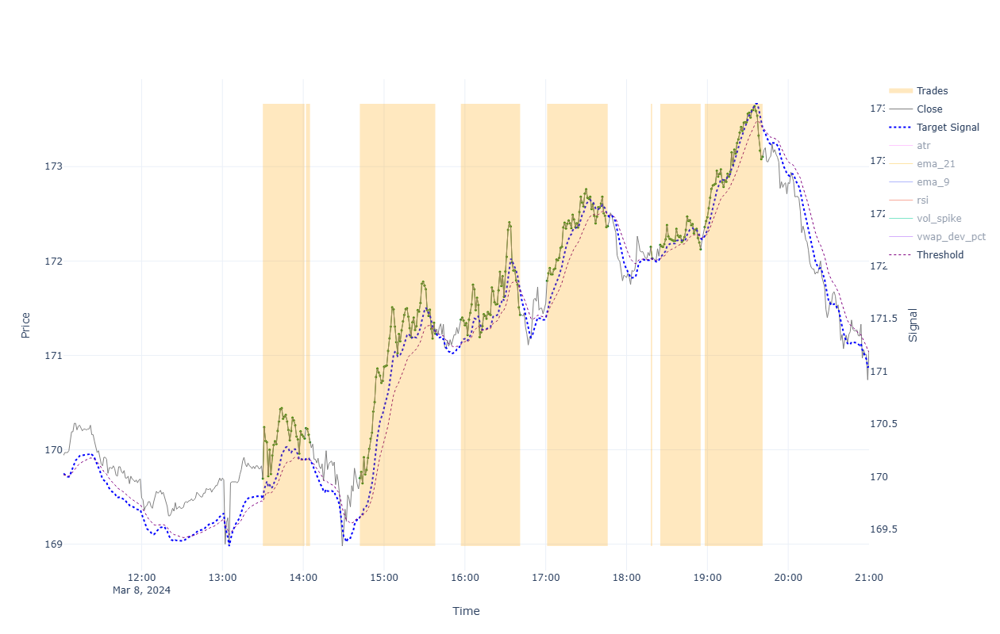


=== Performance for 2024-03-08 00:00:00 ===

BUY&HOLD:
  Bid(0) 171.021 - Ask(0) 169.729 - Fee(0) [0.004+0.028] = 1.26
TRADES:
  Bid(1) 170.086 - Ask(1) 169.729 - Fee(1) [0.004+0.028] = 0.325
  Bid(2) 170.046 - Ask(2) 170.264 - Fee(2) [0.004+0.028] = -0.25
  Bid(3) 171.196 - Ask(3) 169.734 - Fee(3) [0.004+0.028] = 1.43
  Bid(4) 171.396 - Ask(4) 171.414 - Fee(4) [0.004+0.028] = -0.05
  Bid(5) 172.336 - Ask(5) 171.824 - Fee(5) [0.004+0.028] = 0.479
  Bid(6) 171.996 - Ask(6) 172.184 - Fee(6) [0.004+0.028] = -0.221
  Bid(7) 172.091 - Ask(7) 172.204 - Fee(7) [0.004+0.028] = -0.146
  Bid(8) 173.07 - Ask(8) 172.394 - Fee(8) [0.004+0.028] = 0.644
STRATEGY:
  Trade(1) 0.325 + Trade(2) -0.25 + Trade(3) 1.43 + Trade(4) -0.05 + Trade(5) 0.479 + Trade(6) -0.221 + Trade(7) -0.146 + Trade(8) 0.644 = 2.211

------------------------------------------------------------------------------------------------------------------------



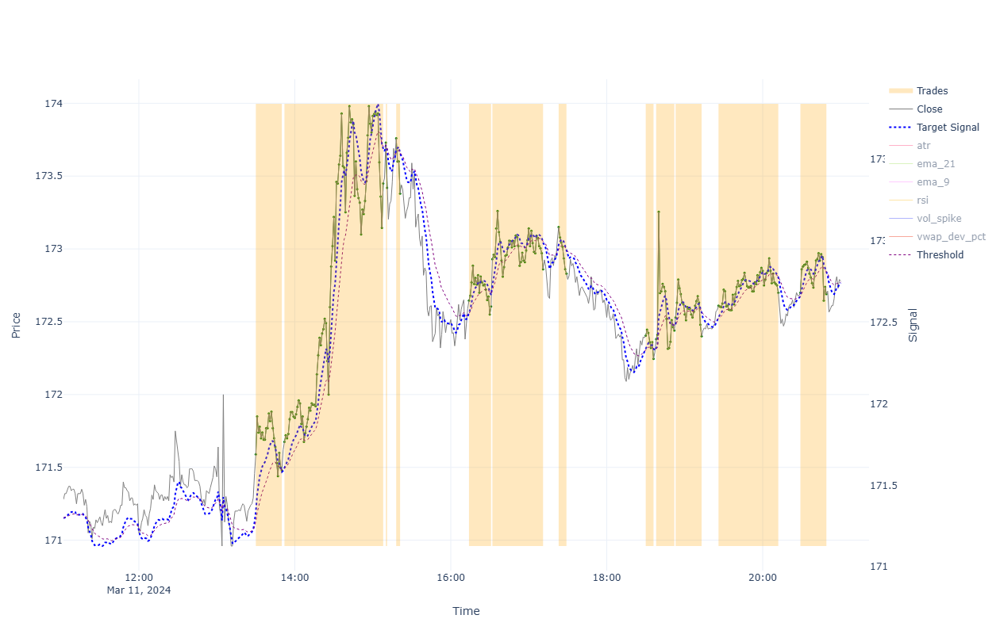


=== Performance for 2024-03-11 00:00:00 ===

BUY&HOLD:
  Bid(0) 172.745 - Ask(0) 171.624 - Fee(0) [0.004+0.028] = 1.089
TRADES:
  Bid(1) 171.446 - Ask(1) 171.624 - Fee(1) [0.004+0.028] = -0.21
  Bid(2) 173.415 - Ask(2) 171.709 - Fee(2) [0.004+0.028] = 1.674
  Bid(3) 173.385 - Ask(3) 173.765 - Fee(3) [0.004+0.028] = -0.412
  Bid(4) 173.345 - Ask(4) 173.795 - Fee(4) [0.004+0.028] = -0.481
  Bid(5) 172.57 - Ask(5) 172.68 - Fee(5) [0.004+0.028] = -0.141
  Bid(6) 172.825 - Ask(6) 172.964 - Fee(6) [0.004+0.028] = -0.171
  Bid(7) 172.795 - Ask(7) 173.185 - Fee(7) [0.004+0.028] = -0.421
  Bid(8) 172.211 - Ask(8) 172.439 - Fee(8) [0.004+0.028] = -0.261
  Bid(9) 172.406 - Ask(9) 172.414 - Fee(9) [0.004+0.028] = -0.041
  Bid(10) 172.366 - Ask(10) 172.563 - Fee(10) [0.004+0.028] = -0.23
  Bid(11) 172.666 - Ask(11) 172.645 - Fee(11) [0.004+0.028] = -0.011
  Bid(12) 172.655 - Ask(12) 172.735 - Fee(12) [0.004+0.028] = -0.111
STRATEGY:
  Trade(1) -0.21 + Trade(2) 1.674 + Trade(3) -0.412 + Trade(4) -0

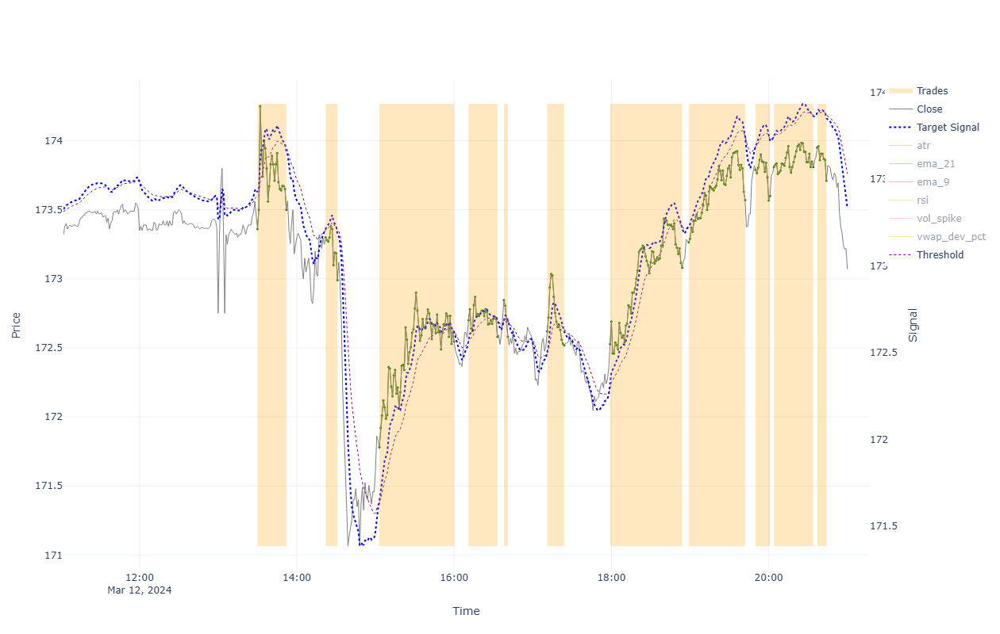


=== Performance for 2024-03-12 00:00:00 ===

BUY&HOLD:
  Bid(0) 173.035 - Ask(0) 173.395 - Fee(0) [0.004+0.028] = -0.391
TRADES:
  Bid(1) 173.465 - Ask(1) 173.395 - Fee(1) [0.004+0.028] = 0.038
  Bid(2) 172.955 - Ask(2) 173.335 - Fee(2) [0.004+0.028] = -0.411
  Bid(3) 172.51 - Ask(3) 171.814 - Fee(3) [0.004+0.028] = 0.664
  Bid(4) 172.545 - Ask(4) 172.735 - Fee(4) [0.004+0.028] = -0.221
  Bid(5) 172.545 - Ask(5) 172.88 - Fee(5) [0.004+0.028] = -0.366
  Bid(6) 172.484 - Ask(6) 172.655 - Fee(6) [0.004+0.028] = -0.202
  Bid(7) 173.045 - Ask(7) 172.562 - Fee(7) [0.004+0.028] = 0.451
  Bid(8) 173.535 - Ask(8) 173.298 - Fee(8) [0.004+0.028] = 0.205
  Bid(9) 173.565 - Ask(9) 173.825 - Fee(9) [0.004+0.028] = -0.292
  Bid(10) 173.775 - Ask(10) 173.845 - Fee(10) [0.004+0.028] = -0.102
  Bid(11) 173.675 - Ask(11) 173.985 - Fee(11) [0.004+0.028] = -0.342
STRATEGY:
  Trade(1) 0.038 + Trade(2) -0.411 + Trade(3) 0.664 + Trade(4) -0.221 + Trade(5) -0.366 + Trade(6) -0.202 + Trade(7) 0.451 + Trade(8) 

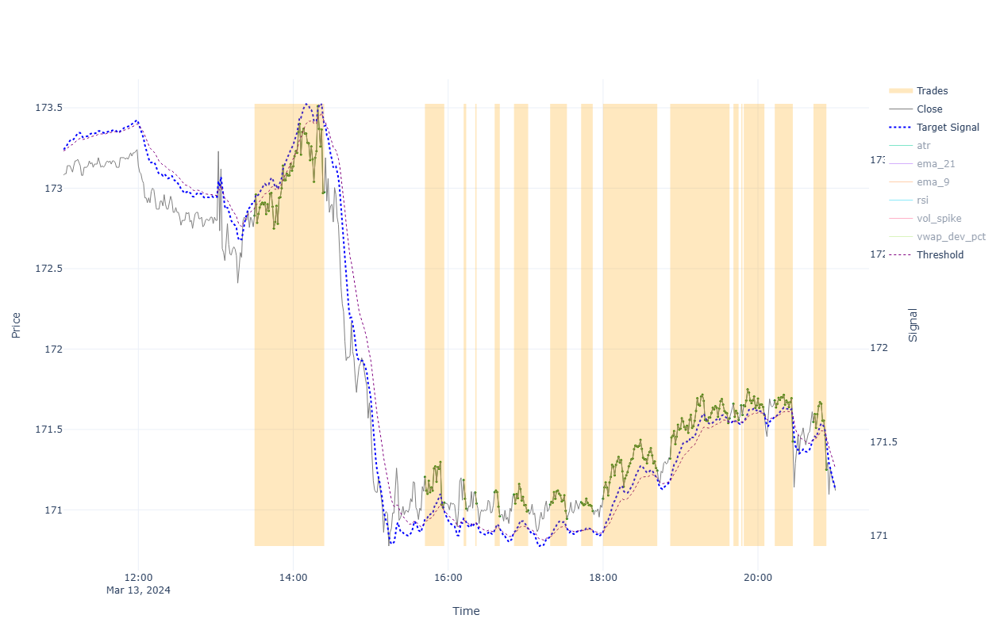


=== Performance for 2024-03-13 00:00:00 ===

BUY&HOLD:
  Bid(0) 171.086 - Ask(0) 172.865 - Fee(0) [0.004+0.028] = -1.811
TRADES:
  Bid(1) 172.94 - Ask(1) 172.865 - Fee(1) [0.004+0.028] = 0.044
  Bid(2) 171.011 - Ask(2) 171.239 - Fee(2) [0.004+0.028] = -0.26
  Bid(3) 170.974 - Ask(3) 171.219 - Fee(3) [0.004+0.028] = -0.277
  Bid(4) 171.006 - Ask(4) 171.142 - Fee(4) [0.004+0.028] = -0.168
  Bid(5) 170.927 - Ask(5) 171.144 - Fee(5) [0.004+0.028] = -0.249
  Bid(6) 170.963 - Ask(6) 171.129 - Fee(6) [0.004+0.028] = -0.198
  Bid(7) 170.911 - Ask(7) 171.067 - Fee(7) [0.004+0.028] = -0.188
  Bid(8) 170.959 - Ask(8) 171.082 - Fee(8) [0.004+0.028] = -0.155
  Bid(9) 171.211 - Ask(9) 171.104 - Fee(9) [0.004+0.028] = 0.075
  Bid(10) 171.536 - Ask(10) 171.354 - Fee(10) [0.004+0.028] = 0.15
  Bid(11) 171.526 - Ask(11) 171.694 - Fee(11) [0.004+0.028] = -0.201
  Bid(12) 171.556 - Ask(12) 171.684 - Fee(12) [0.004+0.028] = -0.161
  Bid(13) 171.556 - Ask(13) 171.684 - Fee(13) [0.004+0.028] = -0.161
  Bid(

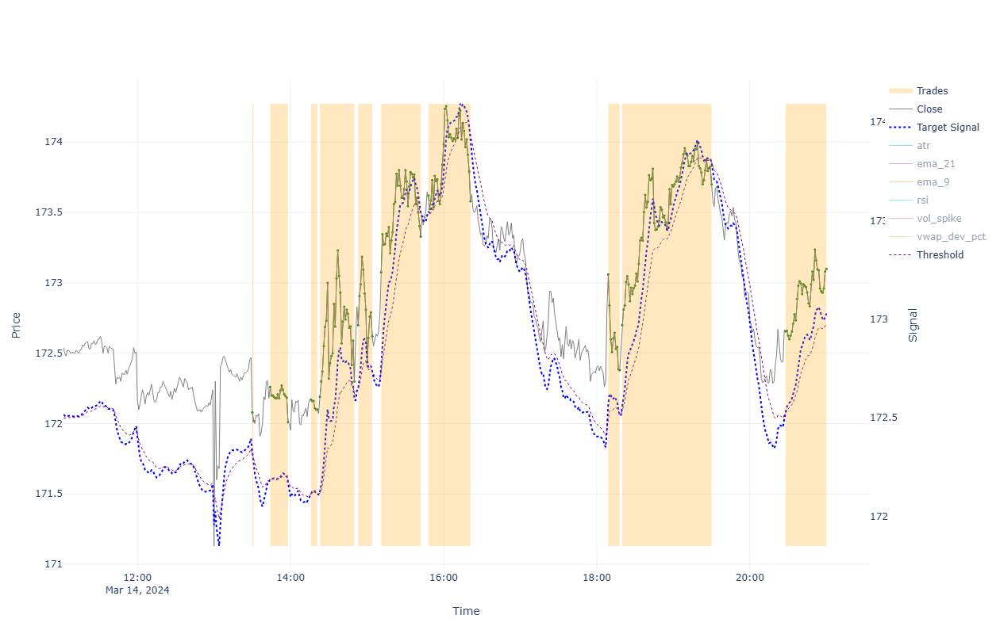


=== Performance for 2024-03-14 00:00:00 ===

BUY&HOLD:
  Bid(0) 173.065 - Ask(0) 172.114 - Fee(0) [0.004+0.028] = 0.919
TRADES:
  Bid(1) 171.986 - Ask(1) 172.114 - Fee(1) [0.004+0.028] = -0.161
  Bid(2) 171.976 - Ask(2) 172.294 - Fee(2) [0.004+0.028] = -0.351
  Bid(3) 172.066 - Ask(3) 172.204 - Fee(3) [0.004+0.028] = -0.171
  Bid(4) 172.266 - Ask(4) 172.224 - Fee(4) [0.004+0.028] = 0.009
  Bid(5) 172.586 - Ask(5) 172.735 - Fee(5) [0.004+0.028] = -0.18
  Bid(6) 173.294 - Ask(6) 173.111 - Fee(6) [0.004+0.028] = 0.151
  Bid(7) 173.545 - Ask(7) 173.655 - Fee(7) [0.004+0.028] = -0.142
  Bid(8) 172.346 - Ask(8) 173.095 - Fee(8) [0.004+0.028] = -0.781
  Bid(9) 173.665 - Ask(9) 172.735 - Fee(9) [0.004+0.028] = 0.899
  Bid(10) 173.065 - Ask(10) 172.691 - Fee(10) [0.004+0.0] = 0.37
STRATEGY:
  Trade(1) -0.161 + Trade(2) -0.351 + Trade(3) -0.171 + Trade(4) 0.009 + Trade(5) -0.18 + Trade(6) 0.151 + Trade(7) -0.142 + Trade(8) -0.781 + Trade(9) 0.899 + Trade(10) 0.37 = -0.357

---------------------

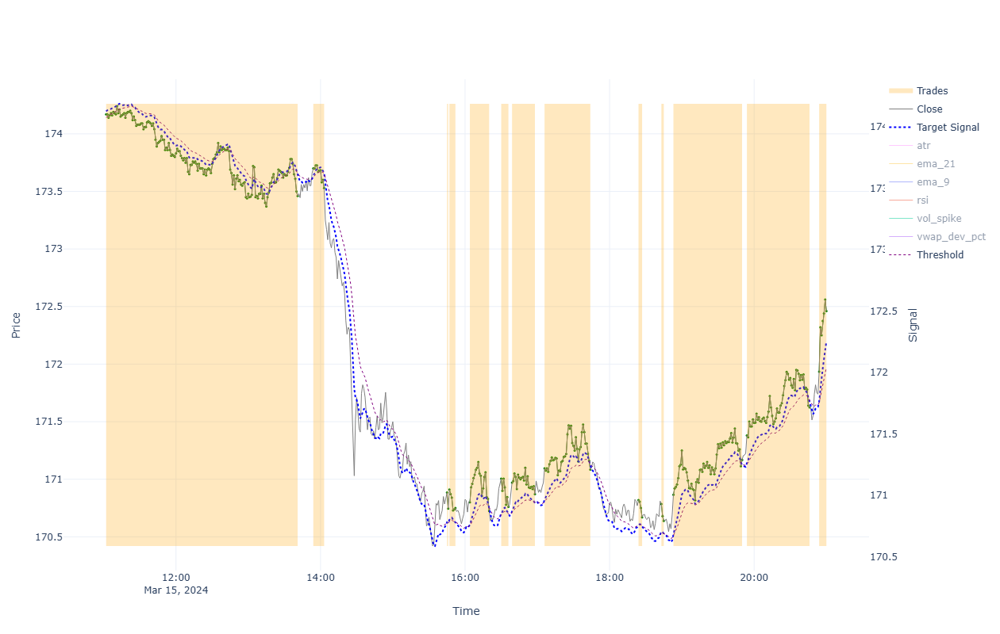


=== Performance for 2024-03-15 00:00:00 ===

BUY&HOLD:
  Bid(0) 172.426 - Ask(0) 173.685 - Fee(0) [0.004+0.028] = -1.291
TRADES:
  Bid(1) 173.425 - Ask(1) 173.065 - Fee(1) [0.0+0.028] = 0.332
  Bid(2) 173.494 - Ask(2) 173.735 - Fee(2) [0.004+0.028] = -0.273
  Bid(3) 170.711 - Ask(3) 170.919 - Fee(3) [0.004+0.028] = -0.24
  Bid(4) 170.716 - Ask(4) 170.944 - Fee(4) [0.004+0.028] = -0.26
  Bid(5) 170.69 - Ask(5) 170.834 - Fee(5) [0.004+0.028] = -0.176
  Bid(6) 170.726 - Ask(6) 171.039 - Fee(6) [0.004+0.028] = -0.345
  Bid(7) 170.836 - Ask(7) 171.004 - Fee(7) [0.004+0.028] = -0.2
  Bid(8) 171.051 - Ask(8) 171.128 - Fee(8) [0.004+0.028] = -0.109
  Bid(9) 170.636 - Ask(9) 170.854 - Fee(9) [0.004+0.028] = -0.25
  Bid(10) 170.605 - Ask(10) 170.819 - Fee(10) [0.004+0.028] = -0.246
  Bid(11) 171.134 - Ask(11) 170.899 - Fee(11) [0.004+0.028] = 0.203
  Bid(12) 171.591 - Ask(12) 171.414 - Fee(12) [0.004+0.028] = 0.145
  Bid(13) 172.426 - Ask(13) 171.969 - Fee(13) [0.004+0.0] = 0.452
STRATEGY:
  Tr

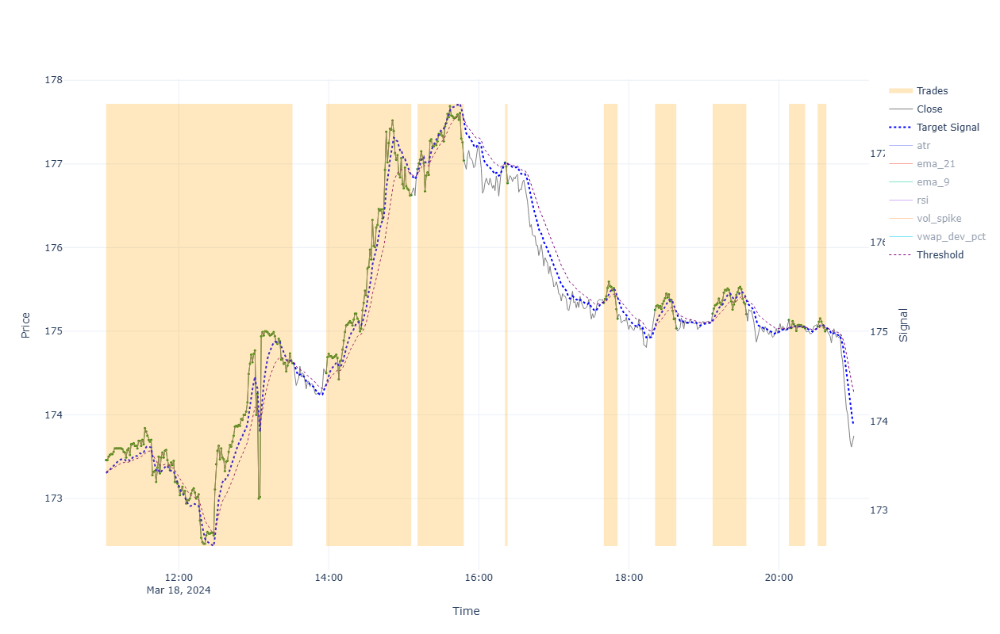


=== Performance for 2024-03-18 00:00:00 ===

BUY&HOLD:
  Bid(0) 173.715 - Ask(0) 174.685 - Fee(0) [0.004+0.028] = -1.002
TRADES:
  Bid(1) 174.585 - Ask(1) 172.426 - Fee(1) [0.0+0.028] = 2.131
  Bid(2) 176.593 - Ask(2) 174.535 - Fee(2) [0.004+0.029] = 2.025
  Bid(3) 177.005 - Ask(3) 176.975 - Fee(3) [0.004+0.029] = -0.003
  Bid(4) 176.735 - Ask(4) 177.05 - Fee(4) [0.004+0.029] = -0.348
  Bid(5) 175.115 - Ask(5) 175.376 - Fee(5) [0.004+0.028] = -0.293
  Bid(6) 175.0 - Ask(6) 175.29 - Fee(6) [0.004+0.028] = -0.322
  Bid(7) 175.17 - Ask(7) 175.245 - Fee(7) [0.004+0.028] = -0.107
  Bid(8) 174.999 - Ask(8) 175.17 - Fee(8) [0.004+0.028] = -0.203
  Bid(9) 174.985 - Ask(9) 175.09 - Fee(9) [0.004+0.028] = -0.137
STRATEGY:
  Trade(1) 2.131 + Trade(2) 2.025 + Trade(3) -0.003 + Trade(4) -0.348 + Trade(5) -0.293 + Trade(6) -0.322 + Trade(7) -0.107 + Trade(8) -0.203 + Trade(9) -0.137 = 2.743

------------------------------------------------------------------------------------------------------------

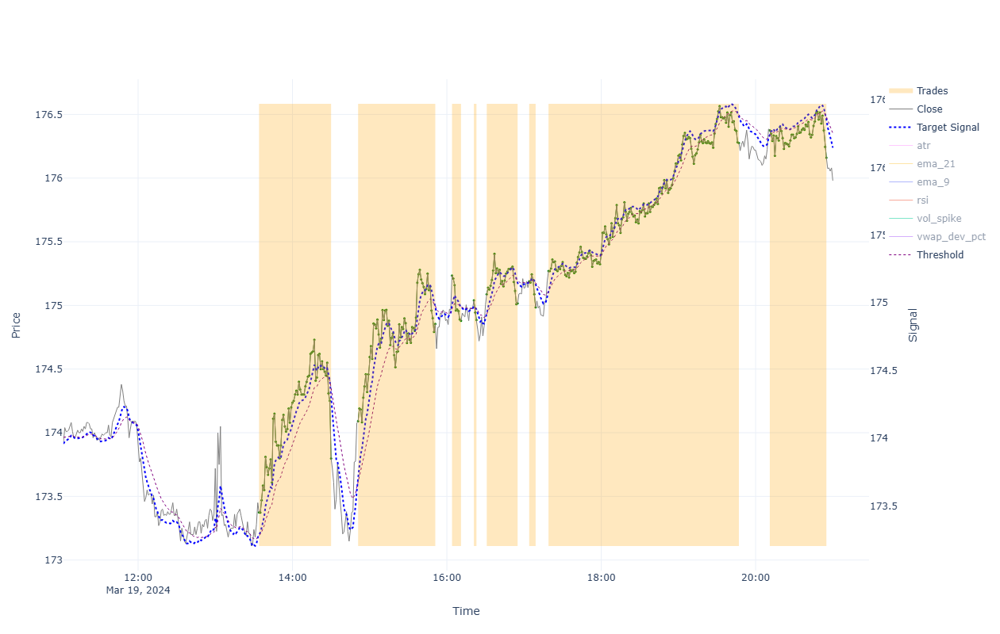


=== Performance for 2024-03-19 00:00:00 ===

BUY&HOLD:
  Bid(0) 175.945 - Ask(0) 173.275 - Fee(0) [0.004+0.028] = 2.638
TRADES:
  Bid(1) 173.763 - Ask(1) 173.41 - Fee(1) [0.004+0.028] = 0.321
  Bid(2) 174.82 - Ask(2) 174.125 - Fee(2) [0.004+0.028] = 0.663
  Bid(3) 174.845 - Ask(3) 175.27 - Fee(3) [0.004+0.028] = -0.457
  Bid(4) 174.85 - Ask(4) 175.075 - Fee(4) [0.004+0.028] = -0.257
  Bid(5) 174.982 - Ask(5) 175.123 - Fee(5) [0.004+0.028] = -0.174
  Bid(6) 174.95 - Ask(6) 175.224 - Fee(6) [0.004+0.028] = -0.306
  Bid(7) 176.24 - Ask(7) 175.305 - Fee(7) [0.004+0.029] = 0.902
  Bid(8) 176.125 - Ask(8) 176.41 - Fee(8) [0.004+0.028] = -0.318
STRATEGY:
  Trade(1) 0.321 + Trade(2) 0.663 + Trade(3) -0.457 + Trade(4) -0.257 + Trade(5) -0.174 + Trade(6) -0.306 + Trade(7) 0.902 + Trade(8) -0.318 = 0.374

------------------------------------------------------------------------------------------------------------------------



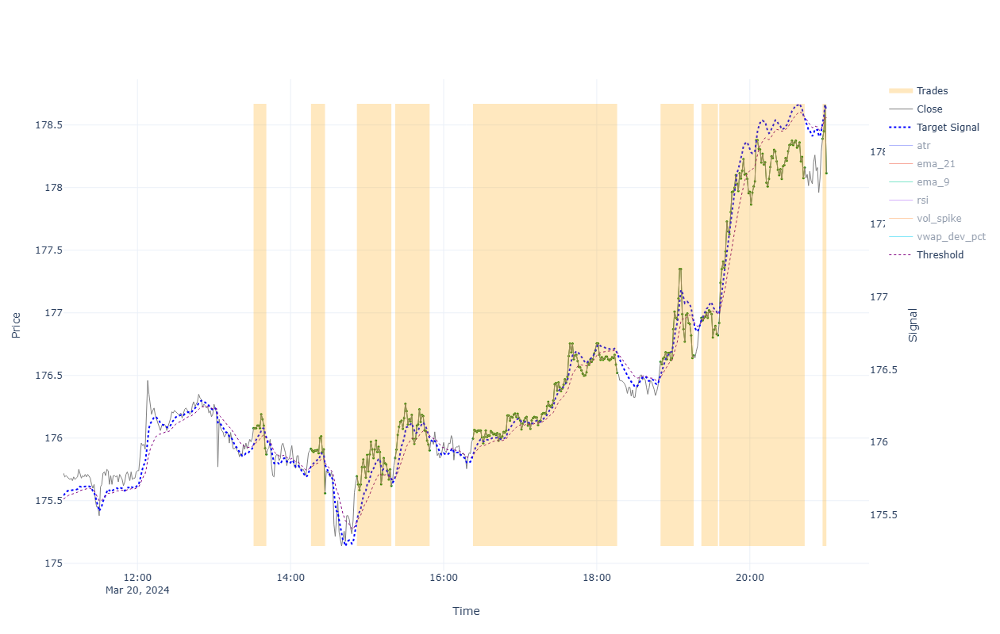


=== Performance for 2024-03-20 00:00:00 ===

BUY&HOLD:
  Bid(0) 178.079 - Ask(0) 176.035 - Fee(0) [0.004+0.029] = 2.011
TRADES:
  Bid(1) 175.835 - Ask(1) 176.115 - Fee(1) [0.004+0.028] = -0.313
  Bid(2) 175.525 - Ask(2) 175.95 - Fee(2) [0.004+0.028] = -0.458
  Bid(3) 175.584 - Ask(3) 175.73 - Fee(3) [0.004+0.028] = -0.179
  Bid(4) 175.867 - Ask(4) 175.875 - Fee(4) [0.004+0.028] = -0.04
  Bid(5) 176.485 - Ask(5) 176.03 - Fee(5) [0.004+0.029] = 0.422
  Bid(6) 176.625 - Ask(6) 176.645 - Fee(6) [0.004+0.029] = -0.053
  Bid(7) 176.786 - Ask(7) 176.995 - Fee(7) [0.004+0.029] = -0.242
  Bid(8) 178.124 - Ask(8) 176.955 - Fee(8) [0.004+0.029] = 1.136
  Bid(9) 178.079 - Ask(9) 178.426 - Fee(9) [0.004+0.0] = -0.35
STRATEGY:
  Trade(1) -0.313 + Trade(2) -0.458 + Trade(3) -0.179 + Trade(4) -0.04 + Trade(5) 0.422 + Trade(6) -0.053 + Trade(7) -0.242 + Trade(8) 1.136 + Trade(9) -0.35 = -0.077

------------------------------------------------------------------------------------------------------------

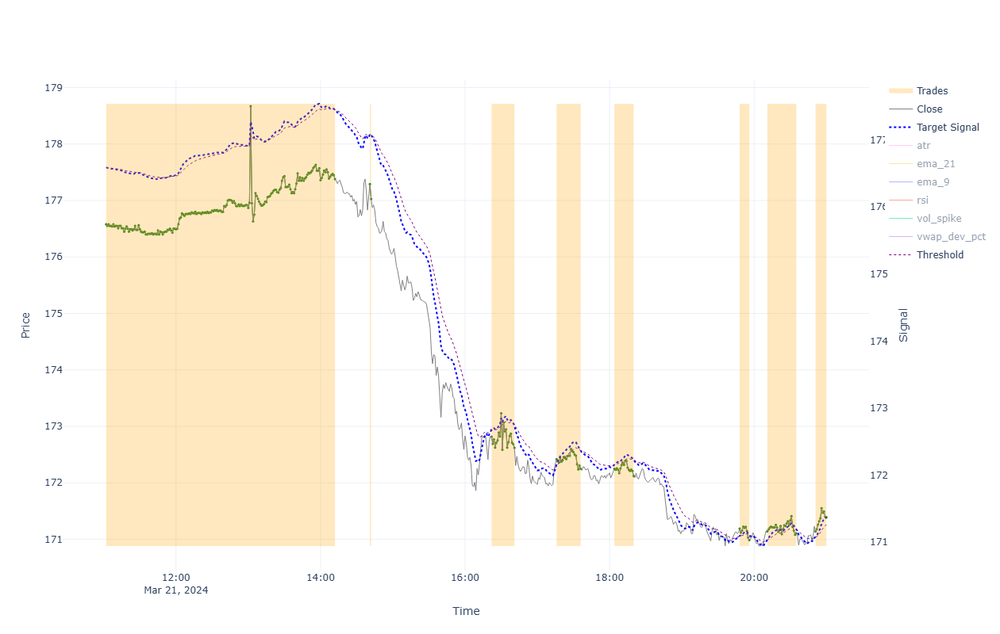


=== Performance for 2024-03-21 00:00:00 ===

BUY&HOLD:
  Bid(0) 171.356 - Ask(0) 177.465 - Fee(0) [0.004+0.028] = -6.142
TRADES:
  Bid(1) 177.345 - Ask(1) 178.079 - Fee(1) [0.0+0.029] = -0.764
  Bid(2) 176.993 - Ask(2) 177.325 - Fee(2) [0.004+0.029] = -0.365
  Bid(3) 172.585 - Ask(3) 172.853 - Fee(3) [0.004+0.028] = -0.299
  Bid(4) 172.216 - Ask(4) 172.45 - Fee(4) [0.004+0.028] = -0.266
  Bid(5) 172.086 - Ask(5) 172.284 - Fee(5) [0.004+0.028] = -0.231
  Bid(6) 170.951 - Ask(6) 171.224 - Fee(6) [0.004+0.028] = -0.305
  Bid(7) 171.07 - Ask(7) 171.174 - Fee(7) [0.004+0.028] = -0.136
  Bid(8) 171.356 - Ask(8) 171.174 - Fee(8) [0.004+0.0] = 0.177
STRATEGY:
  Trade(1) -0.764 + Trade(2) -0.365 + Trade(3) -0.299 + Trade(4) -0.266 + Trade(5) -0.231 + Trade(6) -0.305 + Trade(7) -0.136 + Trade(8) 0.177 = -2.189

------------------------------------------------------------------------------------------------------------------------



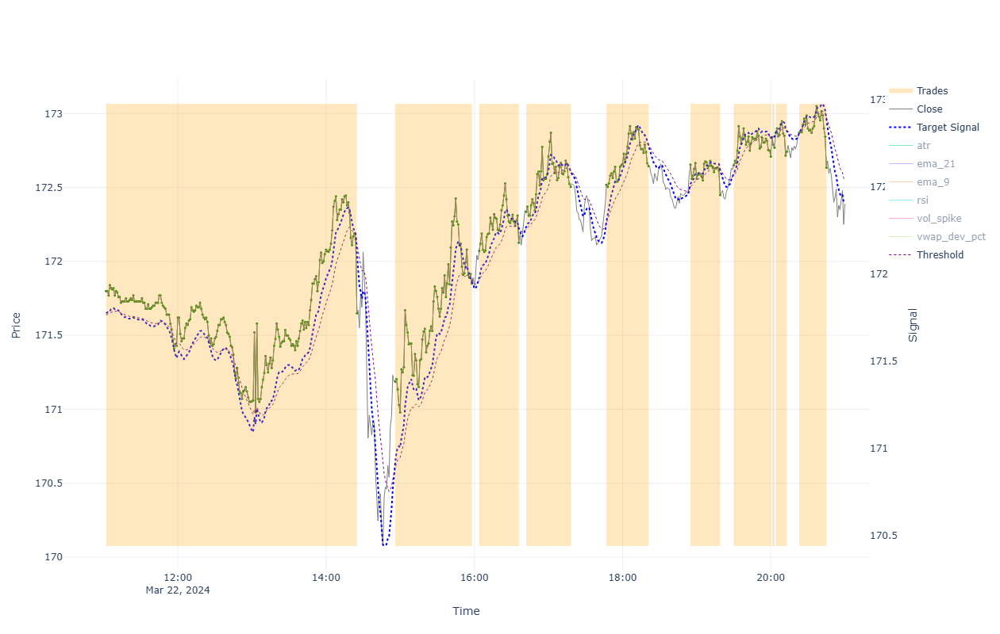


=== Performance for 2024-03-22 00:00:00 ===

BUY&HOLD:
  Bid(0) 172.356 - Ask(0) 171.514 - Fee(0) [0.004+0.028] = 0.809
TRADES:
  Bid(1) 171.616 - Ask(1) 171.356 - Fee(1) [0.0+0.028] = 0.232
  Bid(2) 171.816 - Ask(2) 171.221 - Fee(2) [0.004+0.028] = 0.563
  Bid(3) 172.092 - Ask(3) 172.104 - Fee(3) [0.004+0.028] = -0.045
  Bid(4) 172.47 - Ask(4) 172.369 - Fee(4) [0.004+0.028] = 0.069
  Bid(5) 172.61 - Ask(5) 172.553 - Fee(5) [0.004+0.028] = 0.026
  Bid(6) 172.416 - Ask(6) 172.69 - Fee(6) [0.004+0.028] = -0.306
  Bid(7) 172.675 - Ask(7) 172.685 - Fee(7) [0.004+0.028] = -0.041
  Bid(8) 172.735 - Ask(8) 172.874 - Fee(8) [0.004+0.028] = -0.171
  Bid(9) 172.709 - Ask(9) 172.905 - Fee(9) [0.004+0.028] = -0.228
  Bid(10) 172.6 - Ask(10) 172.905 - Fee(10) [0.004+0.028] = -0.336
STRATEGY:
  Trade(1) 0.232 + Trade(2) 0.563 + Trade(3) -0.045 + Trade(4) 0.069 + Trade(5) 0.026 + Trade(6) -0.306 + Trade(7) -0.041 + Trade(8) -0.171 + Trade(9) -0.228 + Trade(10) -0.336 = -0.237

----------------------

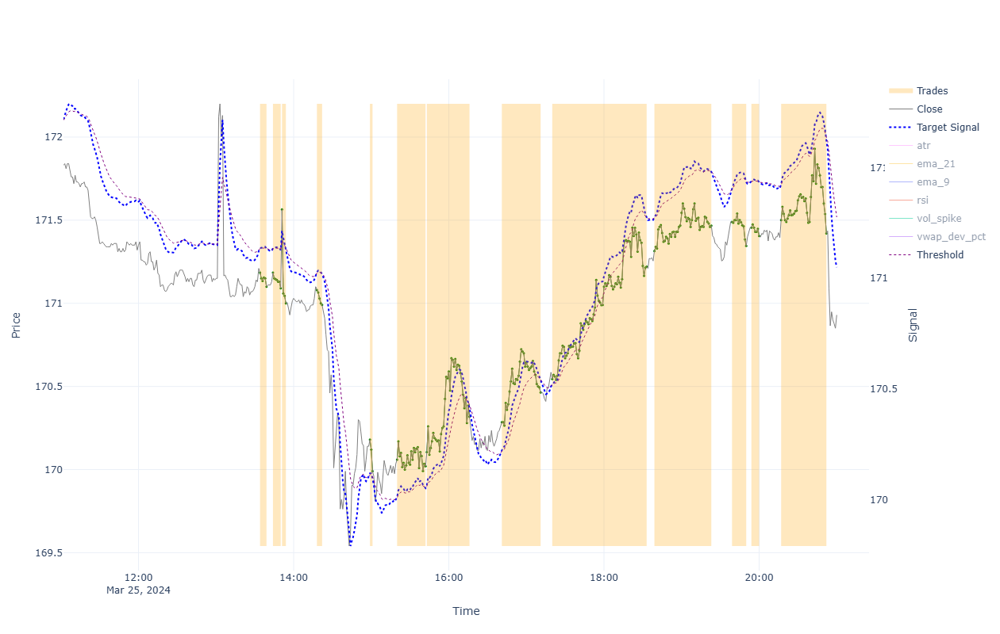


=== Performance for 2024-03-25 00:00:00 ===

BUY&HOLD:
  Bid(0) 170.896 - Ask(0) 171.134 - Fee(0) [0.004+0.028] = -0.27
TRADES:
  Bid(1) 171.066 - Ask(1) 171.219 - Fee(1) [0.004+0.028] = -0.185
  Bid(2) 171.056 - Ask(2) 171.219 - Fee(2) [0.004+0.028] = -0.195
  Bid(3) 170.966 - Ask(3) 171.599 - Fee(3) [0.004+0.028] = -0.665
  Bid(4) 170.956 - Ask(4) 171.114 - Fee(4) [0.004+0.028] = -0.19
  Bid(5) 169.956 - Ask(5) 170.214 - Fee(5) [0.004+0.028] = -0.29
  Bid(6) 169.986 - Ask(6) 170.094 - Fee(6) [0.004+0.028] = -0.14
  Bid(7) 170.284 - Ask(7) 170.139 - Fee(7) [0.004+0.028] = 0.114
  Bid(8) 170.429 - Ask(8) 170.319 - Fee(8) [0.004+0.028] = 0.079
  Bid(9) 171.186 - Ask(9) 170.579 - Fee(9) [0.004+0.028] = 0.575
  Bid(10) 171.433 - Ask(10) 171.349 - Fee(10) [0.004+0.028] = 0.052
  Bid(11) 171.311 - Ask(11) 171.524 - Fee(11) [0.004+0.028] = -0.245
  Bid(12) 171.371 - Ask(12) 171.489 - Fee(12) [0.004+0.028] = -0.15
  Bid(13) 171.386 - Ask(13) 171.534 - Fee(13) [0.004+0.028] = -0.18
STRATEGY:


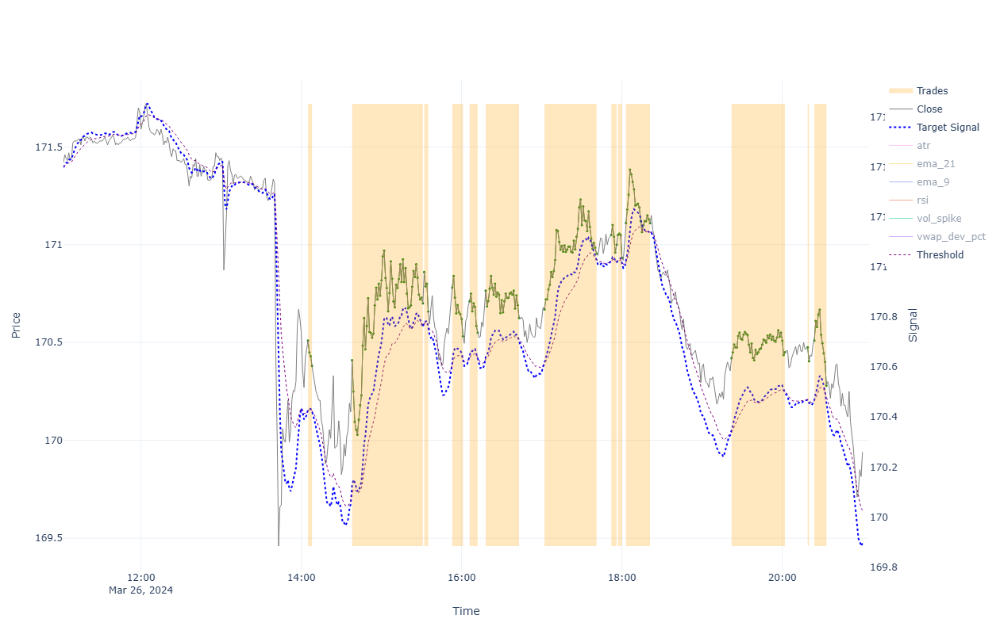


=== Performance for 2024-03-26 00:00:00 ===

BUY&HOLD:
  Bid(0) 169.906 - Ask(0) 171.324 - Fee(0) [0.004+0.028] = -1.45
TRADES:
  Bid(1) 170.346 - Ask(1) 170.544 - Fee(1) [0.004+0.028] = -0.23
  Bid(2) 170.666 - Ask(2) 170.444 - Fee(2) [0.004+0.028] = 0.19
  Bid(3) 170.625 - Ask(3) 170.894 - Fee(3) [0.004+0.028] = -0.301
  Bid(4) 170.498 - Ask(4) 170.814 - Fee(4) [0.004+0.028] = -0.347
  Bid(5) 170.516 - Ask(5) 170.744 - Fee(5) [0.004+0.028] = -0.26
  Bid(6) 170.591 - Ask(6) 170.799 - Fee(6) [0.004+0.028] = -0.24
  Bid(7) 170.92 - Ask(7) 170.704 - Fee(7) [0.004+0.028] = 0.184
  Bid(8) 170.966 - Ask(8) 171.084 - Fee(8) [0.004+0.028] = -0.15
  Bid(9) 170.899 - Ask(9) 171.084 - Fee(9) [0.004+0.028] = -0.217
  Bid(10) 171.076 - Ask(10) 171.144 - Fee(10) [0.004+0.028] = -0.1
  Bid(11) 170.416 - Ask(11) 170.454 - Fee(11) [0.004+0.028] = -0.07
  Bid(12) 170.371 - Ask(12) 170.509 - Fee(12) [0.004+0.028] = -0.17
  Bid(13) 170.246 - Ask(13) 170.544 - Fee(13) [0.004+0.028] = -0.33
STRATEGY:
  Tr

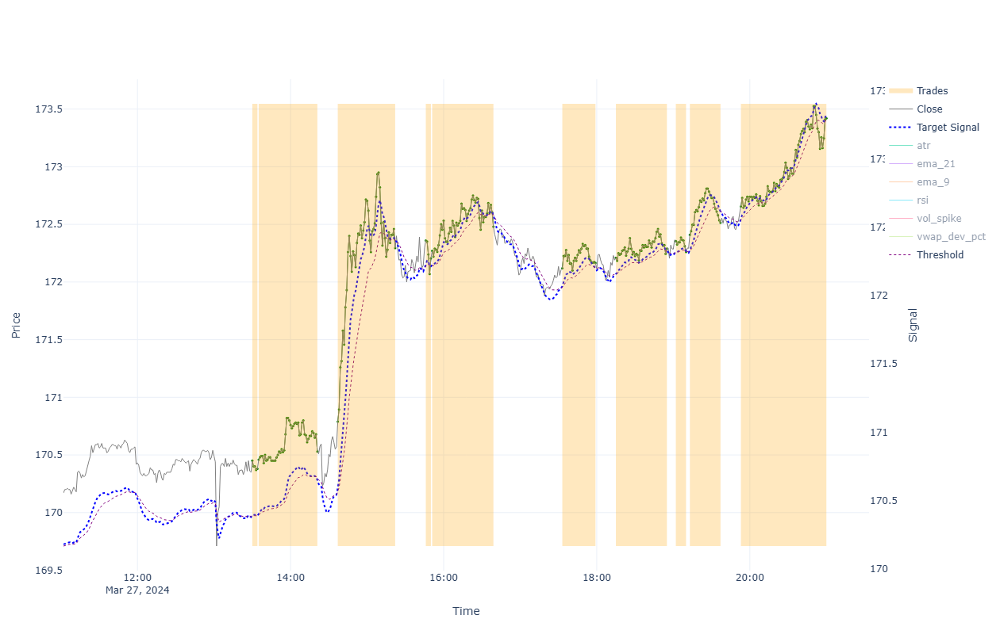


=== Performance for 2024-03-27 00:00:00 ===

BUY&HOLD:
  Bid(0) 173.385 - Ask(0) 170.484 - Fee(0) [0.004+0.028] = 2.869
TRADES:
  Bid(1) 170.346 - Ask(1) 170.484 - Fee(1) [0.004+0.028] = -0.17
  Bid(2) 170.496 - Ask(2) 170.494 - Fee(2) [0.004+0.028] = -0.03
  Bid(3) 172.261 - Ask(3) 170.824 - Fee(3) [0.004+0.028] = 1.404
  Bid(4) 172.171 - Ask(4) 172.394 - Fee(4) [0.004+0.028] = -0.256
  Bid(5) 172.446 - Ask(5) 172.304 - Fee(5) [0.004+0.028] = 0.109
  Bid(6) 172.131 - Ask(6) 172.154 - Fee(6) [0.004+0.028] = -0.056
  Bid(7) 172.256 - Ask(7) 172.244 - Fee(7) [0.004+0.028] = -0.021
  Bid(8) 172.226 - Ask(8) 172.389 - Fee(8) [0.004+0.028] = -0.196
  Bid(9) 172.48 - Ask(9) 172.444 - Fee(9) [0.004+0.028] = 0.004
  Bid(10) 173.385 - Ask(10) 172.69 - Fee(10) [0.004+0.0] = 0.692
STRATEGY:
  Trade(1) -0.17 + Trade(2) -0.03 + Trade(3) 1.404 + Trade(4) -0.256 + Trade(5) 0.109 + Trade(6) -0.056 + Trade(7) -0.021 + Trade(8) -0.196 + Trade(9) 0.004 + Trade(10) 0.692 = 1.48

-------------------------

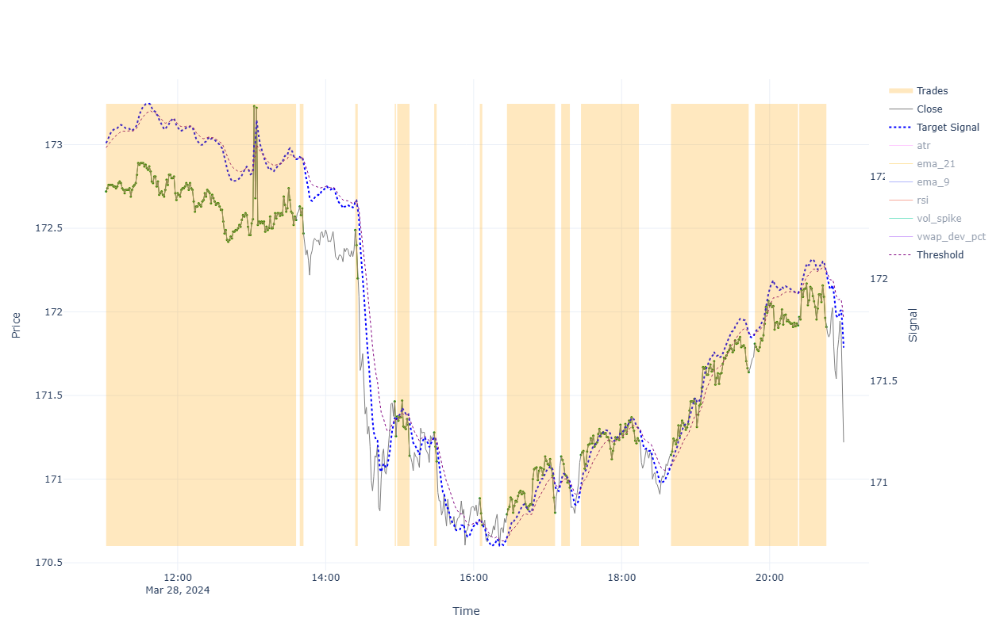


=== Performance for 2024-03-28 00:00:00 ===

BUY&HOLD:
  Bid(0) 171.186 - Ask(0) 172.775 - Fee(0) [0.004+0.028] = -1.621
TRADES:
  Bid(1) 172.515 - Ask(1) 173.385 - Fee(1) [0.0+0.028] = -0.898
  Bid(2) 172.436 - Ask(2) 172.665 - Fee(2) [0.004+0.028] = -0.261
  Bid(3) 172.166 - Ask(3) 172.524 - Fee(3) [0.004+0.028] = -0.391
  Bid(4) 171.224 - Ask(4) 171.499 - Fee(4) [0.004+0.028] = -0.307
  Bid(5) 171.106 - Ask(5) 171.409 - Fee(5) [0.004+0.028] = -0.335
  Bid(6) 171.072 - Ask(6) 171.313 - Fee(6) [0.004+0.028] = -0.273
  Bid(7) 170.691 - Ask(7) 170.919 - Fee(7) [0.004+0.028] = -0.26
  Bid(8) 170.766 - Ask(8) 170.824 - Fee(8) [0.004+0.028] = -0.09
  Bid(9) 170.916 - Ask(9) 171.169 - Fee(9) [0.004+0.028] = -0.285
  Bid(10) 171.196 - Ask(10) 171.179 - Fee(10) [0.004+0.028] = -0.015
  Bid(11) 171.606 - Ask(11) 171.179 - Fee(11) [0.004+0.028] = 0.395
  Bid(12) 171.886 - Ask(12) 171.844 - Fee(12) [0.004+0.028] = 0.009
  Bid(13) 171.876 - Ask(13) 172.004 - Fee(13) [0.004+0.028] = -0.16
STRATEG

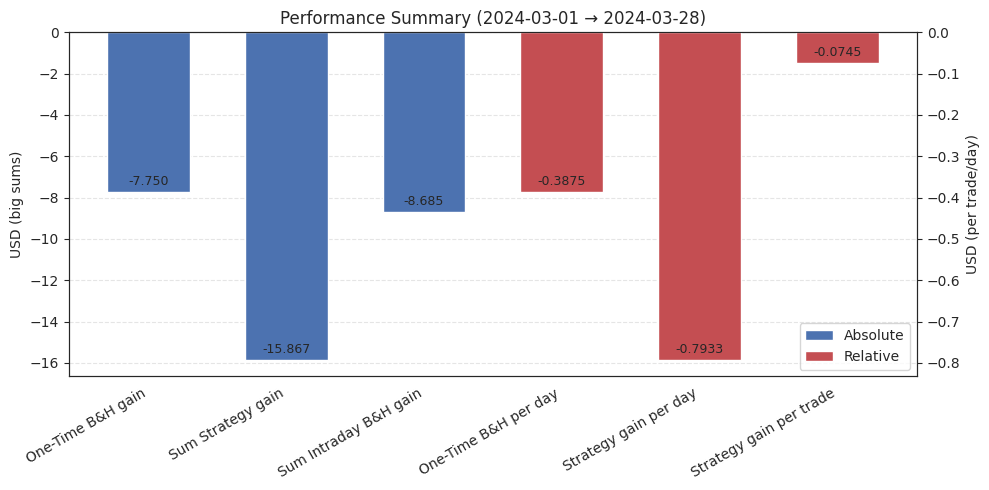


Overall Summary (2009-01-02 = 3.070 → 2025-06-18 = 196.501)
Num. trading days: 4141
Trades Count: 213

One-Time B&H gain: 193.430
Sum Strategy gain: -15.867
Sum Intraday B&H gain: -8.685

One-Time B&H gain per day: 0.0467
Strategy gain per day: -0.0038
Strategy gain per trade: -0.0745


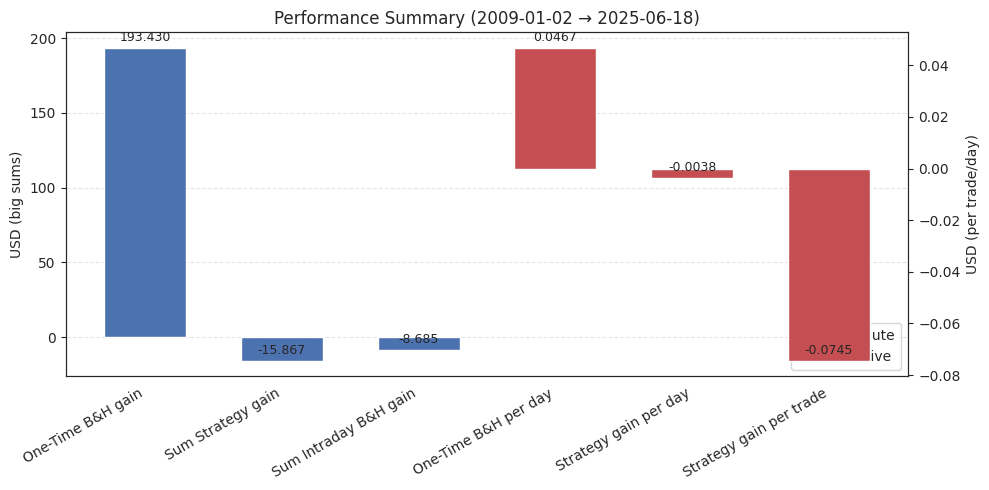

In [17]:
importlib.reload(params) ######
importlib.reload(plots) ######

# df_month = df_inds[df_inds.index.to_period("M") == params.month_to_check]
year, month = map(int, params.month_to_check.split("-"))
days_in_month = [d for d in sim_results if d.year == year and d.month == month]
feats_inds = ['ema_9','ema_21','rsi','vwap_dev_pct','vol_spike','atr']

if not days_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for day in sorted(days_in_month):
        df_day, trades_day, stats_day = sim_results[day]
        plots.plot_trades(
            df = df_day,
            col_signal1 = "ema_9",
            sign_thresh = "ema_21", 
            # col_close = "close",
            trades = trades_day,
            performance_stats = stats_day,
            features = feats_inds,
            autoscale = True
        )
        
        print(f"\n=== Performance for {day} ===\n")
        for k, v in stats_day.items():
            lines = v if isinstance(v, list) else str(v).splitlines()
            print(f"{k}:")
            for L in lines:
                print("  " + L)
        print("\n" + "-" * 120 + "\n")

# monthly / overall aggregates
plots.aggregate_performance([sim_results[d][2] for d in sorted(days_in_month)], df_month)
plots.aggregate_performance([sim_results[d][2] for d in sorted(sim_results)], df_inds)
